# Domaci zadatak iz predmeta prepoznavanje oblika 
## Esmir Pljakic 0205/2017, OS

In [1]:
# Ucitavanje potrebnih biblioteka za izradu domaceg zadatka
from __future__ import print_function
from pylab import *
%matplotlib inline

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import skimage # scikit-image
from skimage import *
from skimage.color import *  # za kolor sisteme
from skimage.exposure import * # za transformacije intenziteta
from skimage.filters import * # prostorne operacije nad pikselima
from skimage import filters
from skimage import exposure
from skimage import img_as_float 

import numpy as np

import imageio # za ucidavanje hdr slika formata HFR-FI

import time # za merenje vremena izvrsavanje funkcije

### Prvi zadatak

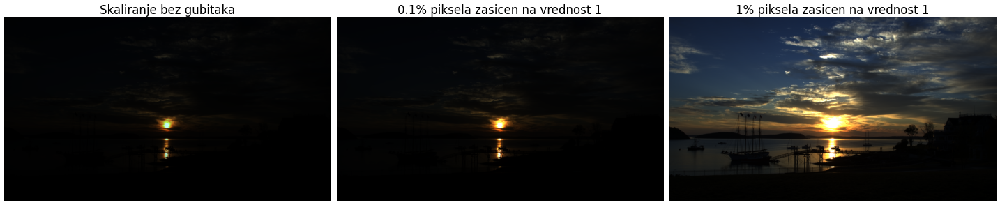

In [4]:
# Ucitavanje slike
f = imageio.imread('sea.hdr', format='HDR-FI') # Ucitavanje slike koja je sirokog dinamickog opsega
f = f/max(f.flatten())  #slika ce biti u opsegu od 0-1, njeno skaliranje

high_in1 = np.percentile(f.flatten(), 99.9) # vraca vrednost koliko je piksela tamnije od 99% piksela u slici 
high_in2 = np.percentile(f.flatten(), 99)

# Vrsimo zasicenje 0.1% najsvetlijih piksela na vrednost 1
f1 = rescale_intensity(f, in_range=(0, high_in1), out_range=(0,1))
f2 = rescale_intensity(f, in_range=(0, high_in2), out_range=(0,1))

# Iscrtavanje slika dobijenih razvlacenjem kontrasta
fix, axes = plt.subplots(ncols =3, figsize=(24,16), dpi=60)
ax = axes.ravel()

ax[0].imshow(f, vmin=0, vmax=1); ax[0].set_title('Skaliranje bez gubitaka', fontsize=20)
ax[1].imshow(f1, vmin=0, vmax=1); ax[1].set_title('0.1% piksela zasicen na vrednost 1', fontsize=20)
ax[2].imshow(f2, vmin=0, vmax=1); ax[2].set_title('1% piksela zasicen na vrednost 1', fontsize=20)

for a in ax.ravel():
    a.axis('off')
tight_layout()
plt.show()

U ovoj tacki se trazilo da se izvrsi linearno mapiranje slike i da se nakon toga izvrsi gama korekcija. <br>
Gama korekcija smanjuje broj bita koji je potreban za kvantizaciju, a takodje je dobra aproksimacija odziva naseg vizuelnog sistema.

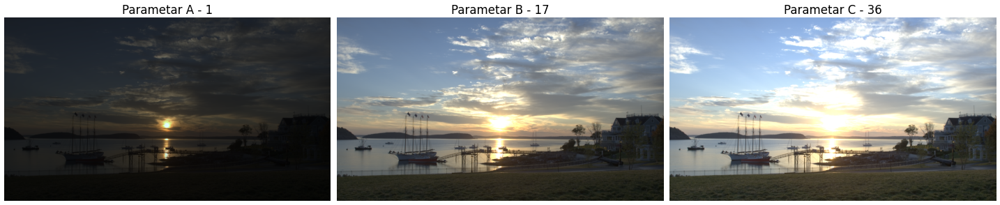

In [11]:
# A
A = 1
B = 17
C = 36

# Linearno mapiranje slike
h1 = A*f
h1[h1 > 1] = 1
h1[h1 < 0] = 0

h2 = B*f
h2[h2 > 1] = 1
h2[h2 < 0] = 0 
 
h3 = C * f
h3[h3 > 1] = 1
h3[h3 < 0] = 0

# Gama korekcija slike
g1 = exposure.adjust_gamma(h1, 1/2.2)
g2 = exposure.adjust_gamma(h2, 1/2.2)
g3 = exposure.adjust_gamma(h3, 1/2.2)

# Iscrtavanje slika
fig, axes = plt.subplots(ncols = 3, figsize = (24, 16), dpi = 60)
ax = axes.ravel()

ax[0].imshow(g1, vmin = 0, vmax = 1); ax[0].set_title('Parametar A - ' + str(A), fontsize = 20)
ax[1].imshow(g2, vmin = 0, vmax = 1); ax[1].set_title('Parametar B - ' + str(B), fontsize = 20)
ax[2].imshow(g3, vmin = 0, vmax = 1); ax[2].set_title('Parametar C - ' + str(C), fontsize = 20)

for a in ax.ravel():
    a.axis('off')
tight_layout()
plt.show()

U ovoj tacki se trazilo da se izvrsi mapiranje slike logaritamskom i stepenom funkcijom. <br>
Primenom logaritamske funkcije za transformaciju dobicemo svetliju sliku, zbog samog oblika logaritamske funkcije. <br>
Primenom stepene funkcije cemo dobiti tamniju sliku, zato sto je prakticno inverzna funkcija od logaritamske.

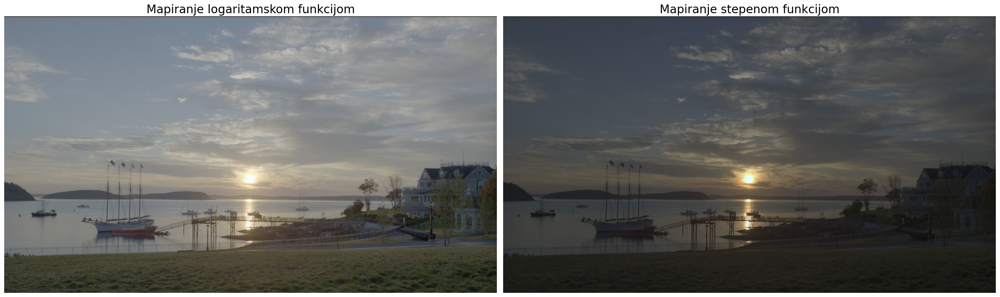

In [7]:
#B
# Menjajuci vrednost parametra c u interaktu, ovo mi deluje priblizno jednako slici koja je data u tekstu domaceg zadatka.
# logaritamska transformacija
c = 10000
g = log(1 + c*f)/log(1 + c)
# Stepena transformacija
gama = 0.3
h = f**gama

# Iscrtavanje slika
fig, axes = plt.subplots(ncols = 2, figsize = (24, 16), dpi = 120)
ax = axes.ravel()

ax[0].imshow(g, vmin = 0, vmax = 1); ax[0].set_title('Mapiranje logaritamskom funkcijom', fontsize = 20)
ax[1].imshow(h, vmin = 0, vmax = 1); ax[1].set_title('Mapiranje stepenom funkcijom', fontsize = 20)

for a in ax.ravel():
    a.axis('off')
tight_layout()
plt.show()

Ovde smo imali slobodu da uradimo transformacije slike tako da dobijemo sto lepse rezultate. <br>
Napravio sam funkciju u kojoj je bilo moguce menjati parametre koji su dole odredjeni. Zabelezio sam ove parametre za koje mi se slika najvise dopala. <br>
Odlucio sam se da prvo uradim gama korekciju kako bih dobio svetliju sliku i gama korekciju, a potom sam izvrsio razvlacenje kontrasta za sve tri komponente slike R, G i B.

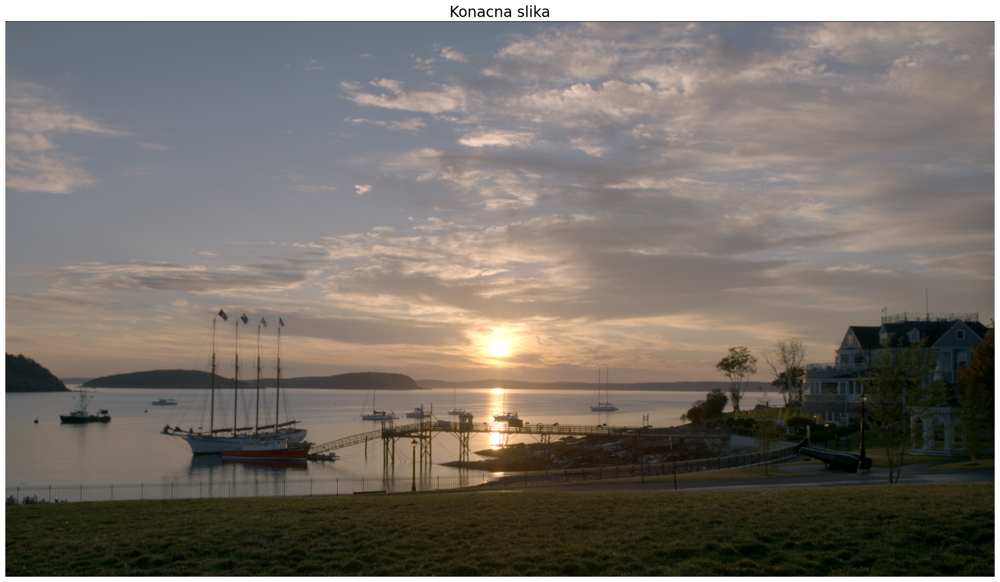

In [12]:
# c = 4070, gama=0.85, rmin=0.04, rmax=0.85, gmin=0.02, gmax=0.95, bmin=0.04, bmax=0.97
g = log(1 + 4070*f)/log(1 + 4070)
h = exposure.adjust_gamma(g, 1/0.85, 1.10)

# Pravljenje nove slike koja je istih dimenzija kao ulazna
img = np.zeros(shape(f))

# Razvlacenje kontrasta   
img[:,:,0] = rescale_intensity(h[:,:,0], in_range=(0.04, 0.85), out_range=(0, 1))
img[:,:,1] = rescale_intensity(h[:,:,1], in_range=(0.02, 0.95), out_range=(0, 1))
img[:,:,2] = rescale_intensity(h[:,:,2], in_range=(0.04, 0.97), out_range=(0, 1))

# Iscrtavanje obradjene slike        
fig, ax = plt.subplots(figsize = (24, 16), dpi = 100)

ax.imshow(img)
ax.set_title('Konacna slika', fontsize = 20)

ax.axis('off')
plt.show()


### Drugi zadatak

Ucitavanje slike i njena transformacija u odgovarajuce kolor sisteme, cije ce se komponente kasnije koristiti.

In [10]:
# Ucistavanje slika
f_rgb_mer = imread('marlyn.jpg')
f_lab_mer = rgb2lab(f_rgb_mer)
f_lch_mer = lab2lch(f_lab_mer)
f_ycbcr_mer = rgb2ycbcr(f_rgb_mer)

Posmatrajuci komponente razlicitih kolor sistema koji mogu dati dobru informaciju o crvenoj boji sa usana, izdvojio sam sledece
komponente : Lab-a (razlika izmedju crvene i zelene), LCh - C (zasicenost), YCbCr - Cr (gde je crvena boja Cr komp je velika). <br>
Medjutim ispostavlja se da samo jedna komponenta bilo kog kolor sistema nije dovoljna da dobro izdvoji region usana. <br>
Kombinovanjem razlicitih komponenata sam dosao do sledece dve maske koje ce zajedno izgraditi konacnu masku. <br>
Prva maska uzima cela usta, ali region usana koji je maltene beo nije zahvacen, onda sam pronasao drugu masku koja nosi informaciju o tom sredisnjem delu usana, pomnozio komplemente te dve maske i dobio jednu masku koja je lepo izdvojila usne.

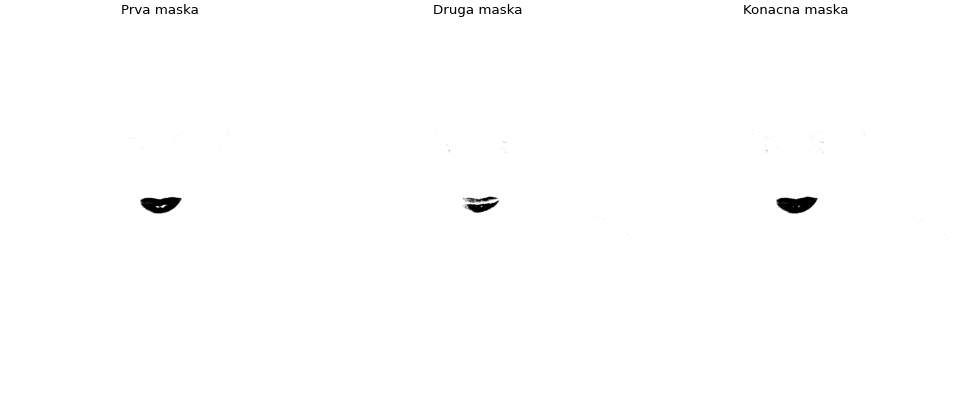

In [21]:
# Obelezja koja ce se sluziti za kreiranje maski
# Vrednosti pragova sa kojima poredim vrednosti maski sam izabrao tako sto sam umesto inline koristio widget i gledao vrednosti
# slike u delu usana 
pattern_1_mer = (f_lab_mer[:,:,0] - 1.5*f_lab_mer[:,:,1] < -15) 
pattern_2_mer = (f_ycbcr_mer[:,:,2] - f_lab_mer[:,:,2] > 151)

dimension = shape(f_rgb_mer)

# Prva maska od prvog obelezja
mask_1_mer = np.zeros((dimension[0], dimension[1]))
mask_1_mer[pattern_1_mer] = 1
mask_1_mer[~pattern_1_mer] = 0
# Komplement maske
m1 = 1 - mask_1_mer


# Druga maska od drugog obelezja
mask_2_mer = np.zeros((dimension[0], dimension[1]))
mask_2_mer[pattern_2_mer] = 1
mask_2_mer[~pattern_2_mer] = 0
# Komplement maske 
m2 = 1- mask_2_mer

m3 = m1*m2
m31 = 1 - m3
mask_mer = filters.gaussian(m31, sigma=4, truncate=3.75)

# Prikas maski kako su dobijene
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (24, 16), dpi = 40)
ax = axes.ravel()

ax[0].imshow(m1, vmin = 0, vmax = 1, cmap='gray'); ax[0].set_title('Prva maska', fontsize = 24)
ax[1].imshow(m2, vmin = 0, vmax = 1, cmap='gray'); ax[1].set_title('Druga maska', fontsize = 24)
ax[2].imshow(m3,  cmap='gray'); ax[2].set_title('Konacna maska', fontsize = 24)

for a in ax.ravel():
    a.axis('off')
tight_layout()
plt.show()

U naredne dve linije koda podesavam da komponente c i h (Lch-kolor sistema) budu 0 na mestima gde nije maska. <br>
Na mestima na kojima se nalazi maska postavljamo prvobitne vrednosti c i h komponente,  a L komponentu cuvamo jer je ona predstava osvetljenosti slike tj. daje crno-belu sliku.

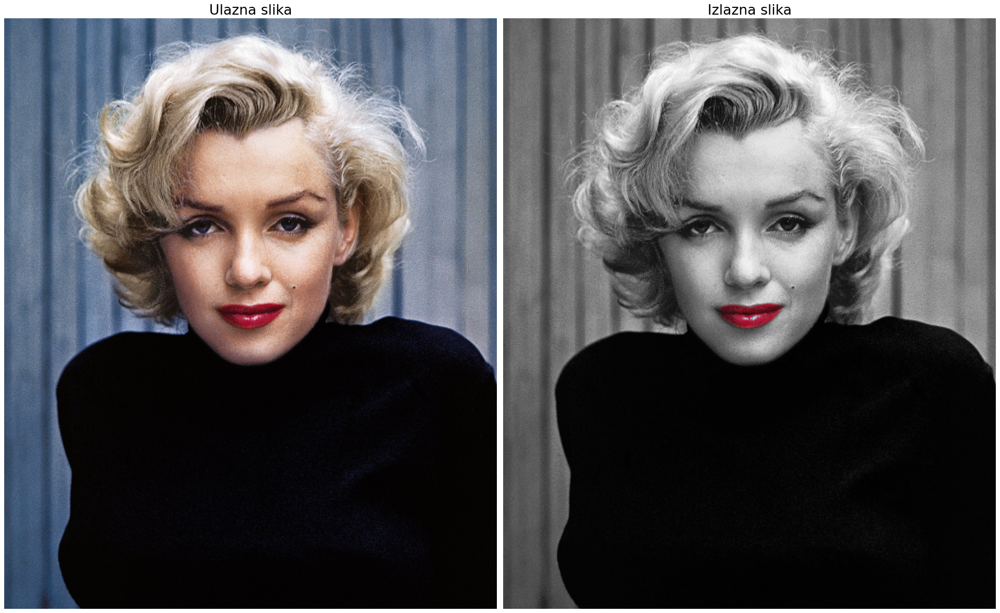

In [22]:
# Kada su komponente c i h Lch kolor sistema na 0, to znaci da je boja siva
f_lch_mer[:, :, 1] = zeros(shape(f_lch_mer[:, :, 1])) + 1*(mask_mer)*f_lch_mer[:, :, 1]
f_lch_mer[:, :, 2]= zeros(shape(f_lch_mer[:, :, 2])) + 1*(mask_mer)*f_lch_mer[:, :, 2]

# Iscrtavanje slika
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (24,16), dpi = 80)
ax = axes.ravel()

ax[0].imshow(f_rgb_mer); ax[0].set_title('Ulazna slika', fontsize = 24)
ax[1].imshow(lab2rgb(lch2lab(f_lch_mer))); ax[1].set_title('Izlazna slika', fontsize = 24)

for a in ax.ravel():
    a.axis('off')
tight_layout()
plt.show()

Jako slicno sve kao za prethodnu sliku, samo sam koristio drugacija obelezja koja ce dobro izdvojiti zutu boju.

In [23]:
# Ucitavanje slika
f_rgb_str = imread('street.jpg')
f_lab_str = rgb2lab(f_rgb_str)
f_lch_str = lab2lch(f_lab_str)

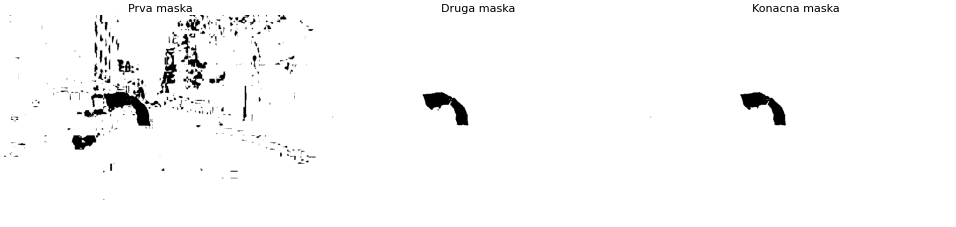

In [24]:
# Izbor obelezja preko nekih komponenata Lab kolor sistema
pattern_1_str = ((f_lab_str[:, :, 1] > -15.7) & (f_lab_str[:,:,1] < -3))
pattern_2_str = (f_lab_str[:, :, 2] + f_lab_str[:, :, 0] > 121)

dimension = shape(f_rgb_str)

# Kreiranje prve maske
mask_1_str = np.zeros((dimension[0], dimension[1]))
mask_1_str[pattern_1_str] = 1
mask_1_str[~pattern_1_str] = 0
m1 = 1 - mask_1_str

# Kreiranje druge maske
mask_2_str = np.zeros((dimension[0], dimension[1]))
mask_2_str[pattern_2_str] = 1
mask_2_str[~pattern_2_str] = 0
m2 = 1- mask_2_str

# Konacna maska
mask_str = mask_1_str*mask_2_str
m3 = 1 - mask_str
#mask_str = filters.gaussian(m31, sigma=1, truncate=5)

# Kako izgledaju maske
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (24,24), dpi = 40)
ax = axes.ravel()

ax[0].imshow(m1, vmin=0, vmax = 1, cmap='gray'); ax[0].set_title('Prva maska', fontsize = 20)
ax[1].imshow(m2, vmin=0, vmax = 1, cmap='gray'); ax[1].set_title('Druga maska', fontsize = 20)
ax[2].imshow(m3, vmin=0, vmax = 1, cmap='gray'); ax[2].set_title('Konacna maska', fontsize = 20)

for a in ax.ravel():
    a.axis('off')
tight_layout()
plt.show()

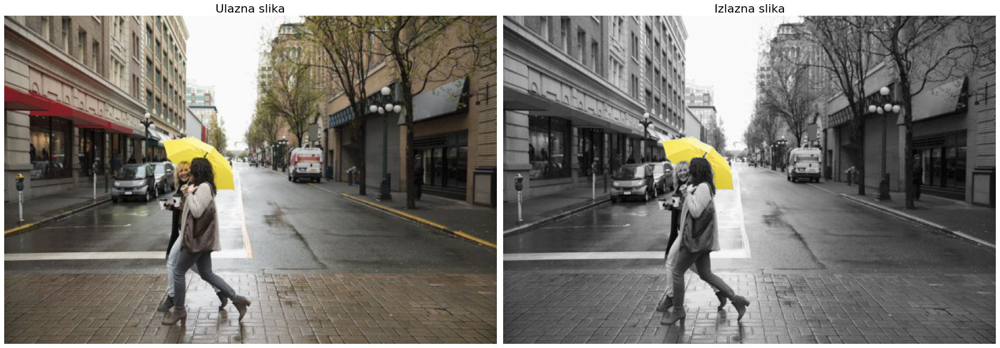

In [25]:
# Ovde sam koristio takodje Lch kolor sistem
f_lch_str[:,:,1]= zeros(shape(f_lch_str[:, :, 1])) + 1*(mask_str > 0)*f_lch_str[:, :, 1]
f_lch_str[:,:,2]= zeros(shape(f_lch_str[:, :, 2])) + 1*(mask_str > 0)*f_lch_str[:, :, 2]

# Iscrtavanje slika
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (24, 24), dpi = 80)
ax = axes.ravel()

ax[0].imshow(f_rgb_str); ax[0].set_title('Ulazna slika', fontsize = 20)
ax[1].imshow(lab2rgb(lch2lab(f_lch_str))); ax[1].set_title('Izlazna slika', fontsize = 20)

for a in ax.ravel():
    a.axis('off')
tight_layout()
plt.show()

### Treci zadatak

U trecem zadataku potrebno je bilo napisati sopstvenu funkciju koja ce da ima ulogu bilateralnog filtra. <br>
Za realizaciju ovog zadatka napravio sam cetiri funkcije : 1) bilateral_filter, 2) expand_image, 3) eksp i 4) eksp2. <br>

In [26]:
# Funkcija eksp je zaduzena da vrati matricu koja predstavlja Gausov filtar.
# Ta matrica ima elemente koje predstavljaju medjusobnu udaljenost izmedju elemenata matrice (Gausovog filtra).
def eksp(x, y, sigma):
    return exp(-(np.square(x) + np.square(y)))/(2*np.square(sigma))

In [27]:
# Fukncijae eksp2 je zaduzena da vrati matricu koja je dodatak Gausovom filtru i zajedno cine Bilateralni filtar.
# Proizvod ove dve matrice dace konacnu matricu Bilateralnog filtra.
# Ova funkcija je zaduzena da vrati elemente koji predstavljaju razliku vrednosti okolnih piksela i centralnog piksela.
def eksp2(x, y, sigma):
    return exp(-np.square(x-y))/(2*np.square(sigma))

In [28]:
# Fukncija koja vrsi prosirivanje slike ponavljanjem redova slike odgovarajuci broj puta.
# Prima kao argument sliku i broj koji kaze koliko puta treba ponoviti redove slike.
def expand_image(x, r):
    s = (len(x) + 2*r, len(x[0]) + 2*r)    
    # Kreiramo sliku koja je prosirenih dimenzija u odnosu na ulaznu sliku
    image = np.zeros(s) 
    # U centralnom delu nove slike upisujemo vrednosti piksela ulazne slike
    image[r : len(x) + r, r : len(x[0]) + r] = x[:,:]                 
    
    # Definisao sam duzinu slike po x i y osi, n1 i n2 respektivno
    n1 = len(x)
    n2 = len(x[0])
    
    # Petlja koja ima ulogu da ponavlja redove i kolone odgovarajuci broj puta
    for k  in range(r, 0, -1):
        # Prosirujemo sliku za gornji red slike
        image[k - 1, k : k + n2] = image[k, k : k + n2]
        # Prosirujemo sliku za donji red slike
        image[k + n1, k : k + n2] = image[k + n1 - 1, k : k + n2]   
        # Prosirujemo sliku za levu kolonu
        image[k :  k + n1, k - 1] = image[k : k + n1, k]
        # Prosirujemo sliku za desnu kolonu
        image[k : k + n1, k + n2] = image[k : k + n1, k+ n2 - 1]
    
        # Prosirivanje coskova slike odg pikselima koji se nalaze u coskovima prethodne slike
        image[k - 1][k - 1] = image[k][k]
        image[k - 1][k + n2] = image[k][k + n2 - 1]
        image[k + n1][k - 1] = image[k + n1 - 1][k]
        image[k + n1][k + n2] = image[k + n1 - 1][k + n2 - 1]
        
        # Posto sliku u svakoj petlji uvecavamo za 2 reda i 2 kolone, nove dimenzije slike se uvecavaju takodje za 2 
        n1 = n1 + 2
        n2 = n2 + 2  
    return image

Bilateralni filtar - Pored tezinske funkcije koja zavisi od prostorne udaljenosti piksela u masci od centra maske uvesti još jednu tezinsku
funkciju koja predstavlja udaljenost vrednosti piksela u masci od vrednosti centralnog piksela. 

In [29]:
# Funkcija bilateralnog filtra
def bilateral_filter(image, radius, sigma_s, sigma_r):
    # Ispitivanje uslova da li je slika odgovarajuceg tipa
    if image.dtype == 'uint8' or image.dtype == 'float64':
        
        # Hteo sam da napravim funkciju koja ce da radi kao ugradjena fja samo sa slikama koje su tipa float64
        # Izvrsio sam skaliranje slike ako je ona tipa uint8
        maksimum = max(image.flatten())
        if maksimum > 2:
            image = image/255
        
        # Prva tezinska funkcija, koja zavisi od prostorne udaljenosti piksela u masci od centra maske
        k = list(range(-radius,radius+1))
        l = list(range(-radius,radius+1))
        K, L = meshgrid(k,l)
        e1 = eksp(K, L, sigma_s)
        
        # Slika koja ce biti izlaz funkcije, koja je jednakih dimenzija kao i ulazna slika
        new_image = np.zeros(image.shape)
        
        # Pravimo prosirenu sliku od ulazne slike
        ex_image = expand_image(image, radius)
        
        # Prolazak kroz svaki piksel ulazne slike
        for i in range(radius, radius + len(image), 1):
            for j in range(radius, radius + len(image[0])):
                piksel = 0
                # Formiranje druge tezinske funkcije, koja uzima u obzir i razliku vrednosti piksela u masci od vrednosti centralnog piksela
                matrica = ex_image[i - radius : i + radius + 1, j - radius : j + radius + 1]
                e2 = eksp2(matrica, ex_image[i,j], sigma_r)
                # Formiranje konacne matrice
                bilateral = e1 * e2
                # Normalizacija maske 
                bilateral = bilateral/sum(bilateral.flatten())
                # Mnozenje elemenata matrice filtra sa odg okolinom centralnog piksela
                piksel = bilateral * ex_image[i - radius : i + radius + 1, j - radius : j + radius + 1]
                piksel = sum(piksel.flatten())
                # Upisivanje konacne vrednosti piksela nakon normalizacije 
                new_image[i - radius][j - radius] = piksel
        
        # Provera ako je ulazna slika bila tipa uint8, vraticu je kao taj ulazni tip, inacne vratim obicnu sliku
        if maksimum > 2:
            new_image = 255 * new_image
            return uint8(new_image)
        else: 
            return new_image   
                
    else :
        # Ako slika nije odgovarajuceg tipa ispisace se greska
        raise ValueError('Greska!')

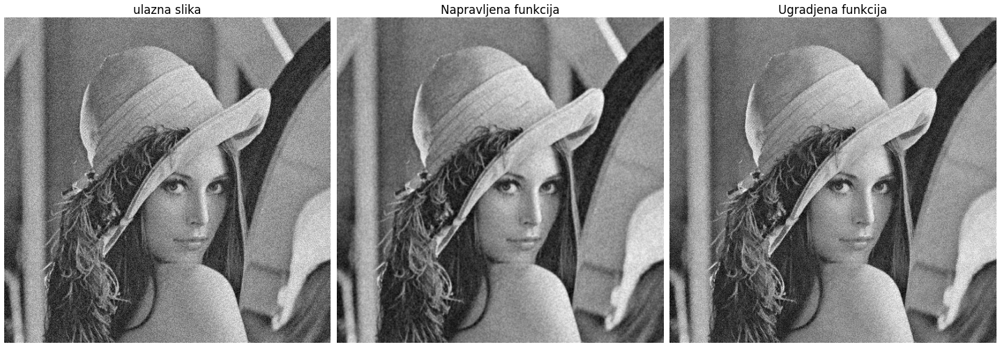

Vreme izvrsavanja: 14.426s 

Vreme izvrsavanja: 14426276.207 us/pix 



In [31]:
# Ucitavanje slike tipa float, zato sto ugradjena funkcija prima sliku samo u ovom opsegu
f = img_as_float(imread('lena.tif'))

# Ovu funkciju sam nasao na netu koja dodaje sum na sliku
noisy = f + 1.3*f.std()*np.random.random(f.shape)

# Izvrsavanje napravljenje funkcije bilateralni filtar
start = time.time() 
bilateral_my = bilateral_filter(noisy, 4, 10, 0.05)
end = time.time() 
execution_time = (end - start) 

# Ugradjena funkcija
bilateral_built = skimage.restoration.denoise_bilateral(noisy, win_size=9, sigma_color=0.05, sigma_spatial=10)

# Iscrtavanje slika
fix, ax = plt.subplots(ncols = 3, figsize=(24,16), dpi=60)
tight_layout()

ax[0].imshow(noisy, cmap='gray'); ax[0].set_title('ulazna slika', fontsize=20)
ax[1].imshow(bilateral_my, cmap='gray'); ax[1].set_title('Napravljena funkcija', fontsize=20)
ax[2].imshow(bilateral_built, cmap='gray'); ax[2].set_title('Ugradjena funkcija', fontsize=20)
for a in ax.ravel():
    a.axis('off')
tight_layout()
plt.show()

# Vreme izvrsavanja funkcije
print('Vreme izvrsavanja: ' + str(round(execution_time,3))+ 's \n')
execution_time_norm = execution_time/np.size(f)
# Vreme izvrsavanja funkcije skalirano sa brojem piksela
print('Vreme izvrsavanja: ' + str(round(execution_time*1e6,3))+ ' us/pix \n') 